In [1]:
using CSV
using DataFrames
using Statistics
using ScikitLearn
using ScikitLearn.Pipelines: Pipeline
using ScikitLearn.CrossValidation: train_test_split
@sk_import feature_selection: (SelectKBest, f_classif)
@sk_import preprocessing: (MinMaxScaler, LabelEncoder)
@sk_import decomposition: (PCA, FastICA)
@sk_import discriminant_analysis: LinearDiscriminantAnalysis
@sk_import manifold: (Isomap, LocallyLinearEmbedding)
@sk_import linear_model: LogisticRegression
using RDatasets
using Random
using StatsBase 
using CategoricalArrays


# Ruta al archivo CSV
file_path = "Datos_Práctica_Evaluación_1.csv"

# Cargar los datos
data = CSV.read(file_path, DataFrame)

# Descripción de los datos
println("Descripción de los datos:")
println("Número de variables (columnas): ", size(data, 2)-2)
println("Número de instancias (filas): ", size(data, 1))
println("Número de individuos únicos: ", length(unique(data.subject)))
println("Número de clases de salida: ", length(unique(data.Activity)))
missing_percentage_per_column = map(col -> mean(ismissing, col) * 100, eachcol(data))
println("Porcentaje de nulos por variable:", missing_percentage_per_column)
println("Media de todos los porcentajes de nulo: ",sum(missing_percentage_per_column) / length(missing_percentage_per_column))


Descripción de los datos:
Número de variables (columnas): 561
Número de instancias (filas): 10299
Número de individuos únicos: 30
Número de clases de salida: 6
Porcentaje de nulos por variable:[0.0, 0.0, 0.0, 0.0, 0.01941936110301971, 0.0, 0.01941936110301971, 0.01941936110301971, 0.029129041654529564, 0.029129041654529564, 0.01941936110301971, 0.0, 0.009709680551509855, 0.0, 0.0, 0.0, 0.009709680551509855, 0.0, 0.0, 0.0, 0.029129041654529564, 0.009709680551509855, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.009709680551509855, 0.0, 0.0, 0.03883872220603942, 0.03883872220603942, 0.01941936110301971, 0.009709680551509855, 0.0, 0.0, 0.0, 0.0, 0.0, 0.029129041654529564, 0.009709680551509855, 0.009709680551509855, 0.0, 0.0, 0.

In [2]:
for col in names(data)
    if eltype(data[!, col]) <: Union{Missing, Real}
        col_mean = mean(skipmissing(data[!, col]))
        data[!, col] = coalesce.(data[!, col], col_mean)
    end
end
missing_percentage_per_column = map(col -> mean(ismissing, col) * 100, eachcol(data))

println("Media de todos los porcentajes de nulo: ",sum(missing_percentage_per_column) / length(missing_percentage_per_column))

Media de todos los porcentajes de nulo: 0.0


In [3]:

# 3. Codificar variables categóricas
categorical_cols = filter(col -> eltype(data[!, col]) <: AbstractString, names(data))
println("Variables categóricas detectadas: ", categorical_cols)
for col in categorical_cols
    data[!, col] = categorical(data[!, col])  # Convertir a tipo categórico
end

# 4. Escalar variables numéricas
numerical_cols = filter(col -> eltype(data[!, col]) <: Number, names(data))
for col in numerical_cols
    col_values = data[!, col]
    data[!, col] = (col_values .- mean(col_values)) ./ std(col_values)  # Z-score
end

println("Transformación de datos completada.")

# 5. Verificar los datos transformados
println("Primeras filas de los datos:")
println(first(data, 5))


Variables categóricas detectadas: ["Activity"]
Transformación de datos completada.
Primeras filas de los datos:
5×563 DataFrame
 Row │ subject   tBodyAcc-mean()-X  tBodyAcc-mean()-Y  tBodyAcc-mean()-Z  tBodyAcc-std()-X  tBodyAcc-std()-Y  tBodyAcc-std()-Z  tBodyAcc-mad()-X  tBodyAcc-mad()-Y  tBodyAcc-mad()-Z  tBodyAcc-max()-X  tBodyAcc-max()-Y  tBodyAcc-max()-Z  tBodyAcc-min()-X  tBodyAcc-min()-Y  tBodyAcc-min()-Z  tBodyAcc-sma()  tBodyAcc-energy()-X  tBodyAcc-energy()-Y  tBodyAcc-energy()-Z  tBodyAcc-iqr()-X  tBodyAcc-iqr()-Y  tBodyAcc-iqr()-Z  tBodyAcc-entropy()-X  tBodyAcc-entropy()-Y  tBodyAcc-entropy()-Z  tBodyAcc-arCoeff()-X,1  tBodyAcc-arCoeff()-X,2  tBodyAcc-arCoeff()-X,3  tBodyAcc-arCoeff()-X,4  tBodyAcc-arCoeff()-Y,1  tBodyAcc-arCoeff()-Y,2  tBodyAcc-arCoeff()-Y,3  tBodyAcc-arCoeff()-Y,4  tBodyAcc-arCoeff()-Z,1  tBodyAcc-arCoeff()-Z,2  tBodyAcc-arCoeff()-Z,3  tBodyAcc-arCoeff()-Z,4  tBodyAcc-correlation()-X,Y  tBodyAcc-correlation()-X,Z  tBodyAcc-correlation()-Y,Z  tGravityAcc

In [4]:

# Semilla para reproducibilidad
seed = 172
Random.seed!(seed)

# Supongamos que los datos están cargados en un DataFrame llamado `data`
# Y que la columna `subject` identifica a cada individuo.

# Obtener la lista única de individuos
individuos = unique(data.subject)

# Seleccionar el 10% de los individuos al azar
num_holdout = ceil(Int, length(individuos) * 0.1)  # Redondeo hacia arriba para asegurar al menos 1
holdout_individuos = StatsBase.sample(individuos, num_holdout, replace=false)
# Dividir los datos en train y holdout
holdout_data = filter(row -> row.subject in holdout_individuos, data)
train_data = filter(row -> !(row.subject in holdout_individuos), data)

# Mostrar los individuos seleccionados para el holdout
println("Individuos en el conjunto de holdout: ", holdout_individuos)

# Mostrar resumen de los conjuntos resultantes
println("Número de filas en el conjunto de entrenamiento: ", nrow(train_data))
println("Número de filas en el conjunto de holdout: ", nrow(holdout_data))


Individuos en el conjunto de holdout: [-1.6299473741119903, -0.36252999202505987, -0.1320904680092543]
Número de filas en el conjunto de entrenamiento: 9342
Número de filas en el conjunto de holdout: 957


In [5]:

using MLJ

# Asegurar reproducibilidad
Random.seed!(172)

# Asumimos que 'train_data' es el DataFrame que contiene los datos de entrenamiento
# después de haber separado el holdout

# Obtener la lista única de participantes en el conjunto de entrenamiento
participantes = unique(train_data.subject)

# Crear un vector para almacenar los índices de los folds
folds = Vector{Vector{Int}}(undef, 5)

# Dividir los participantes en 5 grupos
participantes_shuffled = shuffle(participantes)
grupos_participantes = [participantes_shuffled[i:5:end] for i in 1:5]

# Asignar las instancias a los folds basándose en los grupos de participantes
for (i, grupo) in enumerate(grupos_participantes)
    folds[i] = findall(x -> x in grupo, train_data.subject)
end

# Verificar que cada instancia está en exactamente un fold
total_instancias = sum(length.(folds))
@assert total_instancias == nrow(train_data) "Error en la división de folds"

# Imprimir información sobre los folds
for (i, fold) in enumerate(folds)
    println("Fold $i: $(length(fold)) instancias, $(length(unique(train_data.subject[fold]))) participantes")
end

# Función para realizar el entrenamiento y evaluación en cada fold
function evaluar_fold(modelo, X, y, train_indices, test_indices)
    # Entrenar el modelo
    mach = machine(modelo, X, y)
    fit!(mach, rows=train_indices)
    
    # Evaluar el modelo
    y_pred = predict(mach, rows=test_indices)
    
    # Calcular y retornar la métrica de evaluación (por ejemplo, accuracy)
    return accuracy(y[test_indices], y_pred)
end

function comprobar_individuos_unicos(folds, data)
    for i in 1:length(folds)
        individuos_fold_i = Set(data.subject[folds[i]])
        for j in (i+1):length(folds)
            individuos_fold_j = Set(data.subject[folds[j]])
            if !isempty(intersect(individuos_fold_i, individuos_fold_j))
                println("Error: Los folds $i y $j comparten individuos.")
                return false
            end
        end
    end
    println("Verificación exitosa: No hay individuos compartidos entre los folds.")
    return true
end
# Después de crear tus folds
if comprobar_individuos_unicos(folds, train_data)
    println("La división en folds es correcta.")
else
    println("Hay un problema con la división en folds.")
end



Fold 1: 2170 instancias, 6 participantes
Fold 2: 2132 instancias, 6 participantes
Fold 3: 1688 instancias, 5 participantes
Fold 4: 1733 instancias, 5 participantes
Fold 5: 1619 instancias, 5 participantes
Verificación exitosa: No hay individuos compartidos entre los folds.
La división en folds es correcta.


In [6]:
# Contar participantes originales
total_participantes_original = length(unique(data.subject))

# Contar participantes en el conjunto de entrenamiento
participantes_train = length(unique(train_data.subject))

# Contar participantes en el holdout
participantes_holdout = length(unique(holdout_data.subject))

println("Participantes originales: ", total_participantes_original)
println("Participantes en train: ", participantes_train)
println("Participantes en holdout: ", participantes_holdout)


Participantes originales: 30
Participantes en train: 27
Participantes en holdout: 3


In [7]:

function minmax_scale(x)
    min_val, max_val = extrema(x)
    return (x .- min_val) ./ (max_val - min_val)
end

function aplicar_minmaxscaler(data::DataFrame)
    numeric_columns = names(data)[eltype.(eachcol(data)) .<: Number]
    
    normalized_df = copy(data)
    
    for col in numeric_columns
        normalized_df[!, col] = minmax_scale(data[!, col])
    end
    
    return normalized_df
end

# Aplicar MinMaxScaler a cada fold
normalized_folds = [aplicar_minmaxscaler(train_data[fold, :]) for fold in folds]

# Verificar la normalización
for (i, fold) in enumerate(normalized_folds)
    println("Fold $i normalizado:")
    numeric_columns = names(fold)[eltype.(eachcol(fold)) .<: Number]
    for col in numeric_columns
        min_val = minimum(fold[!, col])
        max_val = maximum(fold[!, col])
        println("  Columna $col: min = $min_val, max = $max_val")
    end
    println()
end


Fold 1 normalizado:
  Columna subject: min = 0.0, max = 1.0
  Columna tBodyAcc-mean()-X: min = 0.0, max = 1.0
  Columna tBodyAcc-mean()-Y: min = 0.0, max = 1.0
  Columna tBodyAcc-mean()-Z: min = 0.0, max = 1.0
  Columna tBodyAcc-std()-X: min = 0.0, max = 1.0
  Columna tBodyAcc-std()-Y: min = 0.0, max = 1.0
  Columna tBodyAcc-std()-Z: min = 0.0, max = 1.0
  Columna tBodyAcc-mad()-X: min = 0.0, max = 1.0
  Columna tBodyAcc-mad()-Y: min = 0.0, max = 1.0
  Columna tBodyAcc-mad()-Z: min = 0.0, max = 1.0
  Columna tBodyAcc-max()-X: min = 0.0, max = 1.0
  Columna tBodyAcc-max()-Y: min = 0.0, max = 1.0
  Columna tBodyAcc-max()-Z: min = 0.0, max = 1.0
  Columna tBodyAcc-min()-X: min = 0.0, max = 1.0
  Columna tBodyAcc-min()-Y: min = 0.0, max = 1.0
  Columna tBodyAcc-min()-Z: min = 0.0, max = 1.0
  Columna tBodyAcc-sma(): min = 0.0, max = 1.0
  Columna tBodyAcc-energy()-X: min = 0.0, max = 1.0
  Columna tBodyAcc-energy()-Y: min = 0.0, max = 1.0
  Columna tBodyAcc-energy()-Z: min = 0.0, max = 1.0

In [8]:
using ScikitLearn
using Random
using DataFrames
using Statistics
using CategoricalArrays
@sk_import feature_selection: (SelectKBest, f_classif, mutual_info_classif)
@sk_import feature_selection: RFE
@sk_import linear_model: LogisticRegression

# Función auxiliar para convertir datos a formato numérico
function prepare_data_for_sklearn(X::DataFrame, y)
    # Convertir DataFrame a matriz
    X_matrix = Matrix{Float64}(X)
    
    # Convertir y a vector numérico si es categorical
    if y isa CategoricalArray
        y_numeric = collect(1:length(unique(y)))[levelcode.(y)]
    else
        y_numeric = convert(Vector{Float64}, y)
    end
    
    return X_matrix, y_numeric
end

# Función para ANOVA Filter
function apply_anova_filter(X::DataFrame, y, k::Int)
    X_matrix, y_numeric = prepare_data_for_sklearn(X, y)
    
    # Aplicar ANOVA F-test
    selector = SelectKBest(f_classif, k=k)
    X_new = selector.fit_transform(X_matrix, y_numeric)
    
    # Obtener índices de características seleccionadas
    selected_features = findall(selector.get_support())
    
    # Crear nuevo DataFrame con características seleccionadas
    selected_columns = names(X)[selected_features]
    return DataFrame(X_new, selected_columns)
end

# Función para Mutual Information
function apply_mutual_info(X::DataFrame, y, k::Int)
    X_matrix, y_numeric = prepare_data_for_sklearn(X, y)
    
    # Aplicar Mutual Information
    selector = SelectKBest(mutual_info_classif, k=k)
    X_new = selector.fit_transform(X_matrix, y_numeric)
    
    # Obtener índices de características seleccionadas
    selected_features = findall(selector.get_support())
    selected_columns = names(X)[selected_features]
    
    return DataFrame(X_new, selected_columns)
end

# Función para RFE
function apply_rfe(X::DataFrame, y)
    X_matrix, y_numeric = prepare_data_for_sklearn(X, y)
    
    # Inicializar modelo de LogisticRegression
    model = LogisticRegression(max_iter=1000)
    
    # Calcular número de características a seleccionar
    n_features = size(X, 2)
    n_features_to_select = floor(Int, n_features / 2)
    
    # Aplicar RFE
    rfe = RFE(estimator=model, 
              n_features_to_select=n_features_to_select,
              step=0.5)
              
    X_new = rfe.fit_transform(X_matrix, y_numeric)
    
    # Obtener características seleccionadas
    selected_features = findall(rfe.support_)
    selected_columns = names(X)[selected_features]
    
    return DataFrame(X_new, selected_columns)
end

# Función principal para aplicar y comparar las técnicas de reducción de dimensionalidad
function apply_and_compare_feature_selection(train_data::DataFrame)
    # Preparar los datos
    feature_cols = setdiff(names(train_data), ["subject", "Activity"])
    X = train_data[:, feature_cols]
    y = train_data.Activity
    
    # Número original de características
    n_features_original = size(X, 2)
    println("\n=== Comparación de Métodos de Reducción de Dimensionalidad ===")
    println("\nCaracterísticas originales: ", n_features_original)
    println("Variables originales: ", names(X))

    # Aplicar cada método
    try
        # ANOVA
        k_anova = floor(Int, n_features_original * 0.5)
        X_anova = apply_anova_filter(X, y, k_anova)
        println("\n--- ANOVA Filter ---")
        println("Características seleccionadas por ANOVA: ", names(X_anova))

        # Mutual Information
        X_mutual = apply_mutual_info(X, y, k_anova)
        println("\n--- Mutual Information Filter ---")
        println("Características seleccionadas por Mutual Information: ", names(X_mutual))

        # RFE
        X_rfe = apply_rfe(X, y)
        println("\n--- Recursive Feature Elimination ---")
        println("Características seleccionadas por RFE: ", names(X_rfe))

        # Análisis de superposición
        anova_features = Set(names(X_anova))
        mutual_features = Set(names(X_mutual))
        rfe_features = Set(names(X_rfe))

        common_features = intersect(anova_features, mutual_features, rfe_features)
        println("\n=== Características comunes en todos los métodos ===")
        println(common_features)

        # Características únicas de cada método
        unique_anova = setdiff(anova_features, union(mutual_features, rfe_features))
        unique_mutual = setdiff(mutual_features, union(anova_features, rfe_features))
        unique_rfe = setdiff(rfe_features, union(anova_features, mutual_features))

        println("\nCaracterísticas únicas de ANOVA:", unique_anova)
        println("Características únicas de Mutual Information:", unique_mutual)
        println("Características únicas de RFE:", unique_rfe)

        # Resumen final
        println("\n=== RESUMEN FINAL ===")
        println("Características originales: ", n_features_original)
        println("Características después de ANOVA: ", size(X_anova, 2))
        println("Características después de Mutual Information: ", size(X_mutual, 2))
        println("Características después de RFE: ", size(X_rfe, 2))
        println("Características comunes en todos los métodos: ", length(common_features))

    catch e
        println("Error durante la reducción de dimensionalidad: ", e)
    end
end

# Ejemplo de uso (requiere un DataFrame `train_data`):
apply_and_compare_feature_selection(train_data)




=== Comparación de Métodos de Reducción de Dimensionalidad ===

Características originales: 561
Variables originales: ["tBodyAcc-mean()-X", "tBodyAcc-mean()-Y", "tBodyAcc-mean()-Z", "tBodyAcc-std()-X", "tBodyAcc-std()-Y", "tBodyAcc-std()-Z", "tBodyAcc-mad()-X", "tBodyAcc-mad()-Y", "tBodyAcc-mad()-Z", "tBodyAcc-max()-X", "tBodyAcc-max()-Y", "tBodyAcc-max()-Z", "tBodyAcc-min()-X", "tBodyAcc-min()-Y", "tBodyAcc-min()-Z", "tBodyAcc-sma()", "tBodyAcc-energy()-X", "tBodyAcc-energy()-Y", "tBodyAcc-energy()-Z", "tBodyAcc-iqr()-X", "tBodyAcc-iqr()-Y", "tBodyAcc-iqr()-Z", "tBodyAcc-entropy()-X", "tBodyAcc-entropy()-Y", "tBodyAcc-entropy()-Z", "tBodyAcc-arCoeff()-X,1", "tBodyAcc-arCoeff()-X,2", "tBodyAcc-arCoeff()-X,3", "tBodyAcc-arCoeff()-X,4", "tBodyAcc-arCoeff()-Y,1", "tBodyAcc-arCoeff()-Y,2", "tBodyAcc-arCoeff()-Y,3", "tBodyAcc-arCoeff()-Y,4", "tBodyAcc-arCoeff()-Z,1", "tBodyAcc-arCoeff()-Z,2", "tBodyAcc-arCoeff()-Z,3", "tBodyAcc-arCoeff()-Z,4", "tBodyAcc-correlation()-X,Y", "tBodyAcc-correl

1", "tBodyGyro-arCoeff()-Y,2", "tBodyGyro-arCoeff()-Y,3", "tBodyGyro-arCoeff()-Y,4", "tBodyGyro-arCoeff()-Z,1", "tBodyGyro-arCoeff()-Z,2", "tBodyGyro-arCoeff()-Z,3", "tBodyGyro-arCoeff()-Z,4", "tBodyGyro-correlation()-X,Y", "tBodyGyro-correlation()-X,Z", "tBodyGyro-correlation()-Y,Z", "tBodyGyroJerk-mean()-X", "tBodyGyroJerk-mean()-Y", "tBodyGyroJerk-mean()-Z", "tBodyGyroJerk-std()-X", "tBodyGyroJerk-std()-Y", "tBodyGyroJerk-std()-Z", "tBodyGyroJerk-mad()-X", "tBodyGyroJerk-mad()-Y", "tBodyGyroJerk-mad()-Z", "tBodyGyroJerk-max()-X", "tBodyGyroJerk-max()-Y", "tBodyGyroJerk-max()-Z", "tBodyGyroJerk-min()-X", "tBodyGyroJerk-min()-Y", "tBodyGyroJerk-min()-Z", "tBodyGyroJerk-sma()", "tBodyGyroJerk-energy()-X", "tBodyGyroJerk-energy()-Y", "tBodyGyroJerk-energy()-Z", "tBodyGyroJerk-iqr()-X", "tBodyGyroJerk-iqr()-Y", "tBodyGyroJerk-iqr()-Z", "tBodyGyroJerk-entropy()-X", "tBodyGyroJerk-entropy()-Y", "tBodyGyroJerk-entropy()-Z", "tBodyGyroJerk-arCoeff()-X,1", "tBodyGyroJerk-arCoeff()-X,2", "tBod

C:\Users\pdcob\anaconda3\envs\julia_env\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\pdcob\anaconda3\envs\julia_env\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html

8.1", "fBodyGyro-mean()-X", "fBodyGyro-max()-X", "fBodyGyro-max()-Y", "fBodyGyro-max()-Z", "fBodyGyro-min()-Y", "fBodyGyro-min()-Z", "fBodyGyro-energy()-X", "fBodyGyro-iqr()-X", "fBodyGyro-entropy()-X", "fBodyGyro-entropy()-Y", "fBodyGyro-entropy()-Z", "fBodyGyro-maxInds-X", "fBodyGyro-maxInds-Y", "fBodyGyro-maxInds-Z", "fBodyGyro-meanFreq()-X", "fBodyGyro-skewness()-X", "fBodyGyro-kurtosis()-X", "fBodyGyro-skewness()-Y", "fBodyGyro-kurtosis()-Y", "fBodyGyro-skewness()-Z", "fBodyGyro-kurtosis()-Z", "fBodyGyro-bandsEnergy()-1,8", "fBodyGyro-bandsEnergy()-41,48", "fBodyGyro-bandsEnergy()-1,16", "fBodyGyro-bandsEnergy()-1,24", "fBodyGyro-bandsEnergy()-9,16.1", "fBodyGyro-bandsEnergy()-25,32.1", "fBodyGyro-bandsEnergy()-9,16.2", "fBodyGyro-bandsEnergy()-17,24.2", "fBodyGyro-bandsEnergy()-17,32.2", "fBodyAccMag-mean()", "fBodyAccMag-std()", "fBodyAccMag-mad()", "fBodyAccMag-max()", "fBodyAccMag-min()", "fBodyAccMag-sma()", "fBodyAccMag-energy()", "fBodyAccMag-iqr()", "fBodyAccMag-entropy()"


=== Aplicando filtrado: rfe ===
Características seleccionadas tras rfe: ["tBodyAcc-mean()-X", "tBodyAcc-mean()-Y", "tBodyAcc-mean()-Z", "tBodyAcc-std()-X", "tBodyAcc-std()-Y", "tBodyAcc-max()-X", "tBodyAcc-max()-Y", "tBodyAcc-max()-Z", "tBodyAcc-min()-X", "tBodyAcc-min()-Y", "tBodyAcc-min()-Z", "tBodyAcc-sma()", "tBodyAcc-energy()-X", "tBodyAcc-energy()-Z", "tBodyAcc-entropy()-X", "tBodyAcc-entropy()-Y", "tBodyAcc-entropy()-Z", "tBodyAcc-arCoeff()-X,1", "tBodyAcc-arCoeff()-X,2", "tBodyAcc-arCoeff()-X,3", "tBodyAcc-arCoeff()-X,4", "tBodyAcc-arCoeff()-Y,1", "tBodyAcc-arCoeff()-Y,4", "tBodyAcc-arCoeff()-Z,1", "tBodyAcc-arCoeff()-Z,2", "tBodyAcc-arCoeff()-Z,3", "tBodyAcc-arCoeff()-Z,4", "tBodyAcc-correlation()-X,Y", "tBodyAcc-correlation()-X,Z", "tBodyAcc-correlation()-Y,Z", "tGravityAcc-mean()-X", "tGravityAcc-mean()-Y", "tGravityAcc-mean()-Z", "tGravityAcc-std()-Y", "tGravityAcc-std()-Z", "tGravityAcc-mad()-Y", "tGravityAcc-mad()-Z", "tGravityAcc-max()-X", "tGravityAcc-max()-Y", "tGravi

C:\Users\pdcob\anaconda3\envs\julia_env\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\pdcob\anaconda3\envs\julia_env\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html



=== Aplicando filtrado: mutual_info ===

C:\Users\pdcob\anaconda3\envs\julia_env\lib\site-packages\sklearn\decomposition\_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(



Características seleccionadas tras mutual_info: ["tBodyAcc-std()-X", "tBodyAcc-max()-X", "tBodyAcc-min()-X", "tGravityAcc-max()-Y", "tGravityAcc-min()-Y", "tBodyAccJerk-max()-X", "tBodyAccJerk-max()-Y", "tBodyAccJerk-max()-Z", "tBodyAccJerk-min()-Y", "tBodyGyroJerk-max()-Z", "tBodyAccMag-max()", "tGravityAccMag-max()", "tBodyAccJerkMag-max()", "fBodyAcc-std()-X", "fBodyAcc-max()-X", "fBodyAcc-energy()-X", "fBodyAcc-bandsEnergy()-1,8", "fBodyAcc-bandsEnergy()-1,16", "fBodyAcc-bandsEnergy()-1,24", "fBodyAccJerk-bandsEnergy()-1,8"]

=== Aplicando reducción: pca ===

=== Aplicando filtrado: anova ===
Características seleccionadas tras anova: ["tBodyAcc-std()-X", "tBodyAcc-max()-X", "tGravityAcc-mean()-X", "tGravityAcc-max()-X", "tGravityAcc-min()-X", "tGravityAcc-energy()-X", "tBodyAccJerk-entropy()-X", "tBodyAccJerk-entropy()-Z", "tBodyAccJerkMag-entropy()", "fBodyAcc-entropy()-X", "fBodyAccJerk-entropy()-X", "fBodyAccJerk-entropy()-Y", "fBodyAccJerk-entropy()-Z", "fBodyBodyAccJerkMag-en

C:\Users\pdcob\anaconda3\envs\julia_env\lib\site-packages\sklearn\manifold\_isomap.py:373: UserWarning: The number of connected components of the neighbors graph is 2 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.
  self._fit_transform(X)
C:\Users\pdcob\anaconda3\envs\julia_env\lib\site-packages\scipy\sparse\_index.py:108: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil and dok are more efficient.
  self._set_intXint(row, col, x.flat[0])


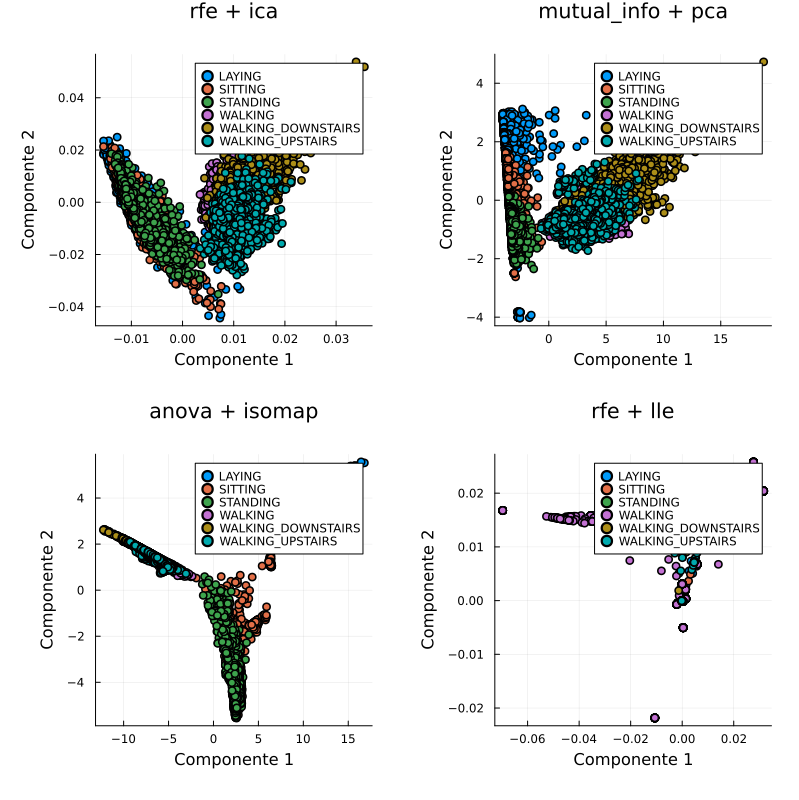

Características seleccionadas tras rfe: ["tBodyAcc-mean()-X", "tBodyAcc-mean()-Y", "tBodyAcc-mean()-Z", "tBodyAcc-std()-X", "tBodyAcc-std()-Y", "tBodyAcc-max()-X", "tBodyAcc-max()-Y", "tBodyAcc-max()-Z", "tBodyAcc-min()-X", "tBodyAcc-min()-Y", "tBodyAcc-min()-Z", "tBodyAcc-sma()", "tBodyAcc-energy()-X", "tBodyAcc-energy()-Z", "tBodyAcc-entropy()-X", "tBodyAcc-entropy()-Y", "tBodyAcc-entropy()-Z", "tBodyAcc-arCoeff()-X,1", "tBodyAcc-arCoeff()-X,2", "tBodyAcc-arCoeff()-X,3", "tBodyAcc-arCoeff()-X,4", "tBodyAcc-arCoeff()-Y,1", "tBodyAcc-arCoeff()-Y,4", "tBodyAcc-arCoeff()-Z,1", "tBodyAcc-arCoeff()-Z,2", "tBodyAcc-arCoeff()-Z,3", "tBodyAcc-arCoeff()-Z,4", "tBodyAcc-correlation()-X,Y", "tBodyAcc-correlation()-X,Z", "tBodyAcc-correlation()-Y,Z", "tGravityAcc-mean()-X", "tGravityAcc-mean()-Y", "tGravityAcc-mean()-Z", "tGravityAcc-std()-Y", "tGravityAcc-std()-Z", "tGravityAcc-mad()-Y", "tGravityAcc-mad()-Z", "tGravityAcc-max()-X", "tGravityAcc-max()-Y", "tGravityAcc-max()-Z", "tGravityAcc-min(

C:\Users\pdcob\anaconda3\envs\julia_env\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\pdcob\anaconda3\envs\julia_env\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html

In [11]:
using Plots
import Plots.plot

# Visualizar datos proyectados en un subplot específico
function visualize_projection!(plt, X_proj::DataFrame, y, title::String, pos::Int)
    scatter!(plt[pos], X_proj[:, 1], X_proj[:, 2], 
            group=y, 
            legend=:topright, 
            xlabel="Componente 1", 
            ylabel="Componente 2", 
            title=title, 
            markersize=4)
end

# Aplicar PCA
function apply_pca(X::DataFrame, y, n_components::Int)
    X_matrix, _ = prepare_data_for_sklearn(X, y)
    pca = PCA(n_components=n_components)
    X_pca = pca.fit_transform(X_matrix)
    return DataFrame(X_pca, :auto)
end

# Aplicar LDA
function apply_lda(X::DataFrame, y, n_components::Int)
    X_matrix, y_numeric = prepare_data_for_sklearn(X, y)
    lda = LinearDiscriminantAnalysis(n_components=n_components)
    X_lda = lda.fit_transform(X_matrix, y_numeric)
    return DataFrame(X_lda, :auto)
end

# Aplicar ICA
function apply_ica(X::DataFrame, y, n_components::Int)
    X_matrix, _ = prepare_data_for_sklearn(X, y)
    ica = FastICA(n_components=n_components, random_state=42)
    X_ica = ica.fit_transform(X_matrix)
    return DataFrame(X_ica, :auto)
end

# Aplicar Isomap
function apply_isomap(X::DataFrame, y, n_components::Int)
    X_matrix, _ = prepare_data_for_sklearn(X, y)
    isomap = Isomap(n_components=n_components)
    X_isomap = isomap.fit_transform(X_matrix)
    return DataFrame(X_isomap, :auto)
end

# Aplicar LLE
function apply_lle(X::DataFrame, y, n_components::Int)
    X_matrix, _ = prepare_data_for_sklearn(X, y)
    lle = LocallyLinearEmbedding(n_components=n_components, random_state=42)
    X_lle = lle.fit_transform(X_matrix)
    return DataFrame(X_lle, :auto)
end
function apply_advanced_reduction(X::DataFrame, y, method::Symbol, n_components::Int=2)
    if method == :pca
        return apply_pca(X, y, n_components)
    elseif method == :lda
        return apply_lda(X, y, n_components)
    elseif method == :ica
        return apply_ica(X, y, n_components)
    elseif method == :isomap
        return apply_isomap(X, y, n_components)
    elseif method == :lle
        return apply_lle(X, y, n_components)
    else
        error("Técnica desconocida: $method")
    end
end
# Función principal para aplicar combinaciones (almacenar resultados)
function apply_combinations(train_data::DataFrame, filter_method::Symbol, 
                            reduction_method::Symbol, k::Union{Int, Nothing}=nothing, 
                            n_components::Int=2)
    feature_cols = setdiff(names(train_data), ["subject", "Activity"])
    X = train_data[:, feature_cols]
    y = train_data.Activity

    # Aplicar filtrado
    println("\n=== Aplicando filtrado: $filter_method ===")
    if filter_method == :anova
        X_filtered = apply_anova_filter(X, y, k)
    elseif filter_method == :mutual_info
        X_filtered = apply_mutual_info(X, y, k)
    elseif filter_method == :rfe
        X_filtered = apply_rfe(X, y)
    else
        error("Método de filtrado desconocido: $filter_method")
    end

    println("Características seleccionadas tras $filter_method: $(names(X_filtered))")

    # Aplicar reducción avanzada
    println("\n=== Aplicando reducción: $reduction_method ===")
    X_reduced = apply_advanced_reduction(X_filtered, y, reduction_method, n_components)
    return (X_reduced, y, "$filter_method + $reduction_method")
end

# Visualizar combinaciones aplicadas (usando resultados guardados)
function visualize_combinations(plt, combinations::Vector, pos::Vector)
    for (i, (X_proj, y, title)) in enumerate(combinations)
        visualize_projection!(plt, X_proj, y, title, pos[i])
    end
end

a = apply_combinations(train_data, :rfe, :ica)
b = apply_combinations(train_data, :mutual_info, :pca, 20)
c = apply_combinations(train_data, :anova, :isomap, 15)
d = apply_combinations(train_data, :rfe, :lle, nothing, 3)

# Ejecutar programa principal
function main(train_data::DataFrame)
    # Crear un layout de 2x2 para los subplots
    plt = plot(layout=(2, 2), size=(800, 800))
    # Aplicar y almacenar los resultados
    combination_results = [
        a,
        b,
        c,
        d   
    ]

    # Visualizar los resultados almacenados
    visualize_combinations(plt, combination_results, [1, 2, 3, 4])

    # Ajustar el espaciado entre subplots
    plot!(plt, margin=5Plots.mm)

    # Mostrar la figura completa
    display(plt)
end

# Llamada al programa principal (requiere un DataFrame `train_data`):
main(train_data)


In [14]:
using Flux  # Para MLP
using ScikitLearn: @sk_import  # Para KNN y SVM
using Statistics  # Para métricas básicas
using PyCall  # Para importar numpy
np = pyimport("numpy")

# Importar clasificadores de ScikitLearn
KNeighborsClassifier = @sk_import neighbors: KNeighborsClassifier
SVC = @sk_import svm: SVC

# Entrenar y evaluar un MLP
function train_mlp(X_train, y_train, X_test, y_test, architecture::Vector{Int})
    # Definir el tamaño de entrada y salida
    input_size = size(X_train, 2)
    output_size = length(unique(y_train))

    # Crear las capas ocultas
    hidden_layers = [Dense(input_size, architecture[1], relu)]
    for i in 2:length(architecture)
        push!(hidden_layers, Dense(architecture[i-1], architecture[i], relu))
    end

    # Agregar la capa de salida sin softmax
    output_layer = Dense(architecture[end], output_size)

    # Crear el modelo como una cadena de capas
    model = Chain(vcat(hidden_layers..., [output_layer])...)

    # Definir la función de pérdida (incluyendo softmax fuera del modelo)
    loss(x, y) = Flux.crossentropy(softmax(model(x)), y)
    optimizer = Flux.ADAM()

    # Convertir datos a formato adecuado
    X_train = permutedims(Matrix(X_train))  # Transponer dimensiones
    X_test = permutedims(Matrix(X_test))    # Transponer dimensiones
    y_train_onehot = Flux.onehotbatch(y_train, unique(y_train))  # One-hot encoding

    # Entrenar el modelo
    for epoch in 1:20
        Flux.train!(loss, Flux.params(model), [(X_train, y_train_onehot)], optimizer)
    end

    # Evaluar el modelo
    y_pred = Flux.onecold(softmax(model(X_test)), unique(y_train))
    accuracy = mean(y_pred .== y_test)
    return accuracy
end

# Entrenar y evaluar un KNN
function train_knn(X_train, y_train, X_test, y_test, k::Int)
    knn = KNeighborsClassifier(n_neighbors=k)
    # Convertir DataFrame a Array
    X_train_array = Matrix(X_train)
    X_test_array = Matrix(X_test)
    
    # Convertir las etiquetas categóricas a numéricas
    unique_labels = unique(y_train)
    label_map = Dict(label => i for (i, label) in enumerate(unique_labels))
    y_train_numeric = [label_map[label] for label in y_train]
    y_test_numeric = [label_map[label] for label in y_test]
    
    knn.fit(X_train_array, y_train_numeric)
    y_pred = knn.predict(X_test_array)
    accuracy = mean(y_pred .== y_test_numeric)
    return accuracy
end

function train_svm(X_train, y_train, X_test, y_test, C::Float64)
    svm = SVC(C=C)
    # Convertir DataFrame a Array
    X_train_array = Matrix(X_train)
    X_test_array = Matrix(X_test)
    
    # Convertir las etiquetas categóricas a numéricas
    unique_labels = unique(y_train)
    label_map = Dict(label => i for (i, label) in enumerate(unique_labels))
    y_train_numeric = [label_map[label] for label in y_train]
    y_test_numeric = [label_map[label] for label in y_test]
    
    svm.fit(X_train_array, y_train_numeric)
    y_pred = svm.predict(X_test_array)
    accuracy = mean(y_pred .== y_test_numeric)
    return accuracy
end


# Evaluar clasificadores con los conjuntos reducidos
function evaluate_classifiers(combinations::Vector)
    for (i, (X, y, title)) in enumerate(combinations)
        println("\n=== Evaluando clasificadores para combinación: $title ===")
        
        # Dividir en conjuntos de entrenamiento y prueba (80/20)
        n_train = Int(round(0.8 * size(X, 1)))
        indices = shuffle(1:size(X, 1))
        train_indices, test_indices = indices[1:n_train], indices[n_train+1:end]
        X_train, X_test = X[train_indices, :], X[test_indices, :]
        y_train, y_test = y[train_indices], y[test_indices]

        # Evaluar MLP
        for arch in [[50], [100], [100, 50]]
            acc_mlp = train_mlp(X_train, y_train, X_test, y_test, arch)
            println("MLP $arch -> Accuracy: $acc_mlp")
        end

        # Evaluar KNN
        for k in [1, 10, 20]
            acc_knn = train_knn(X_train, y_train, X_test, y_test, k)
            println("KNN (k=$k) -> Accuracy: $acc_knn")
        end

        # Evaluar SVM
        for C in [0.1, 0.5, 1.0]
            acc_svm = train_svm(X_train, y_train, X_test, y_test, C)
            println("SVM (C=$C) -> Accuracy: $acc_svm")
        end
    end
end

# Ejecutar programa principal extendido
function main(train_data::DataFrame)
    # Aplicar y almacenar los resultados de reducción
    combination_results = [
        a,
        b,
        c,
        d
    ]

    # Evaluar clasificadores con los conjuntos reducidos
    evaluate_classifiers(combination_results)
end

# Llamada al programa principal (requiere un DataFrame `train_data`):
main(train_data)



=== Evaluando clasificadores para combinación: rfe + ica ===


MLP [50] -> Accuracy: 0.1911134903640257
MLP [100] -> Accuracy: 0.17505353319057815
MLP [100, 50] -> Accuracy: 0.18897216274089937
KNN (k=1) -> Accuracy: 0.5187366167023555
KNN (k=10) -> Accuracy: 0.55406852248394
KNN (k=20) -> Accuracy: 0.5861884368308351
SVM (C=0.1) -> Accuracy: 0.5679871520342612
SVM (C=0.5) -> Accuracy: 0.569593147751606
SVM (C=1.0) -> Accuracy: 0.5797644539614561

=== Evaluando clasificadores para combinación: mutual_info + pca ===
MLP [50] -> Accuracy: 0.3410064239828694
MLP [100] -> Accuracy: 0.3554603854389722
MLP [100, 50] -> Accuracy: 0.6755888650963597
KNN (k=1) -> Accuracy: 0.7317987152034261
KNN (k=10) -> Accuracy: 0.7489293361884368
KNN (k=20) -> Accuracy: 0.7548179871520343
SVM (C=0.1) -> Accuracy: 0.7168094218415417
SVM (C=0.5) -> Accuracy: 0.7162740899357601
SVM (C=1.0) -> Accuracy: 0.715203426124197

=== Evaluando clasificadores para combinación: anova + isomap ===
MLP [50] -> Accuracy: 0.5074946466809421
MLP [100] -> Accuracy: 0.35867237687366166
ML